<b>Анализ для фонда «Shut Up and Take My Money»</b>

Задачи:

1. Обработать и подготовить данные.
2. Структурирование, коррекция и, если возможно, дополнения в данные.
3. Визуализация необходимых данных для выполнения задачи.
4. Оформление презентации.
5. Сделать выводы, удовлетворяющие условию задач.
6. Четкое следование поставленных в ТЗ задач.

In [1]:
# Импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import math
import plotly.express as px 
from folium import Map, Marker, Choropleth
from plotly import graph_objects as go 
import json
from folium.plugins import MarkerCluster

pd.set_option("display.float_format", "{:.2f}".format)

# Шаг 1. Загрузите данные и изучите общую информацию

Загрузите данные о заведениях общественного питания Москвы.

In [2]:
# Читаем .csv

data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# Изучим файл moscow_places.csv

# Посмотрим первые 5 строк фрейма

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


<b>Описание столбцов:</b>

- <b>name</b> — название заведения
- <b>address</b> — адрес заведения
- <b>category</b> — категория заведения, например «кафе», «пиццерия» или «кофейня»
- <b>hours</b> — информация о днях и часах работы
- <b>lat</b> — широта географической точки, в которой находится заведение
- <b>lng</b> — долгота географической точки, в которой находится заведение
- <b>rating</b> — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
- <b>price</b> — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее
- <b>avg_bill</b> — средняя стоимость заказа в виде диапазона
- <b>middle_avg_bill</b> — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»
- <b>middle_coffee_cup</b> — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»
- <b>chain</b> — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки)
- <b>district</b> — административный район, в котором находится заведение, например Центральный административный округ
- <b>seats</b> — количество посадочных мест

In [4]:
# Ознакомимся с информацией по фрейму

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
# Посмотрим наличие пропусков в данных

data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [6]:
# Посмотрим в % пропусков

data.isna().mean().to_frame().rename(columns={0 : 'доля_пропусков'}).style.format({'доля_пропусков' : '{:.2%}'})

,доля_пропусков
name,0.00%
category,0.00%
address,0.00%
district,0.00%
hours,6.38%
lat,0.00%
lng,0.00%
rating,0.00%
price,60.56%
avg_bill,54.60%


In [7]:
# Посмотрим наличие явных дубликатов в данных

data.duplicated().sum()

0

In [8]:
# Посмотрим количество уникальных заведений

print('В Москве', len(data['name'].unique()), 'уникальных заведений')

В Москве 5614 уникальных заведений


In [9]:
# Посмотрим на топ распрастраненных заведений

data['name'].value_counts().head(10)

Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Яндекс Лавка         69
Cofix                65
Prime                50
Хинкальная           44
Шаурма               43
Name: name, dtype: int64

<b>Предварительный вывод на основании ознакомления с датафреймом:</b>

1. Пропуски в данных
- столбец hours (время работы) отсутствует 6.38% данных.
- столбец price (категория цен) отсутствует 60.56% данных.
- столбец avg_bill (средняя стоимость заказа в виде диапазона) отсутствует 60.56% данных.
- столбец middle_avg_bill (число с оценкой среднего чека) отсутствует 62.54% данных.
- столбец middle_coffee_cup	(число с оценкой одной чашки капучино) отсутствует 93.64% данных.
- столбец seats (количество посадочных мест) отсутствует 42.96% данных.

2. Типы данных
- следует заменить тип данных в столбце seats с float на int. Количество посадочных мест должно быть целым числом.

3. Возникшие подозрения
- Самое распрастраненное кафе в Москве имеет имя "Кафе", выглядет как заглушка, дефолтное название. Да некоторые другие вызывают вопросы, однако удалять сразу не стоит, т.к. они несут важную информацию которая пригодится в анализе.

# Шаг 2. Выполните предобработку данных

In [10]:
# Заменим тип данных в столбце seats

data['seats'] = data['seats'].astype('Int64')

In [11]:
# Создайте столбец street с названиями улиц из столбца с адресом

data['address'] = data['address'].str.lower()
data['street'] = (data['address'].str.extract(
    '(([А-яё0-9\s\-]+)?(улица|переулок|шоссе|площадь|проспект|проезд|бульвар|набережная|микрорайон|аллея|квартал|линия|тупик)([А-яё0-9\s]+)?)')[0])
data['street'] = data['street'].str.strip()

In [12]:
# Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

#Создаем столбец все False по умолчанию
data['is_24/7'] = False

#Добавим условие через которое False заменится на True
data.loc[data['hours'] == "ежедневно, круглосуточно", 'is_24/7'] = True

# Шаг 3. Анализ данных

<b>Задача 1:</b> Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [13]:
# Создадим сводную таблицу для визуализации и удобства

category_pivot = data.groupby('category').agg({'category':'count'}).rename(
    columns={'category':'count'}).sort_values(by='count', ascending=False).reset_index()
category_pivot['share'] = (category_pivot['count'] / category_pivot['count'].sum()).apply(lambda x: f"{x:1.2%}")
category_pivot

,category,count,share
0,кафе,2378,28.29%
1,ресторан,2043,24.30%
2,кофейня,1413,16.81%
3,"бар,паб",765,9.10%
4,пиццерия,633,7.53%
5,быстрое питание,603,7.17%
6,столовая,315,3.75%
7,булочная,256,3.05%


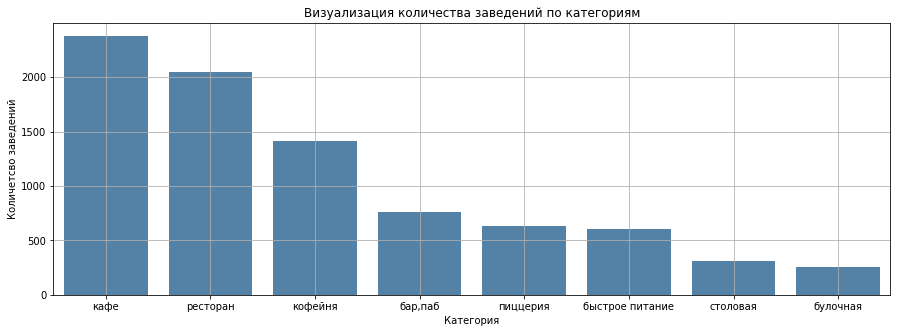

In [70]:
# Построим график barplot

plt.figure(figsize=(15, 5))
sns.barplot(x='category', y='count', data=category_pivot, color='#4682B4') 
plt.title('Визуализация количества заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количетсво заведений')
plt.grid();

In [15]:
# Построим график Pie

fig = go.Figure(data=[go.Pie(
    labels=category_pivot['category'], values=category_pivot['count'], title='Визуализация количества заведений по категориям', )])

fig.show();

<b>Вывод:</b>
Самая популярная категория заведения - "Кафе", она занимает 28.3% от всех заведений. На втором месте категория "Ресторан". На третьем месте категория "Кофейня". Самые не распрастраненные оказались "Столовые" и "Булочные".

<b>Задача 2:</b> Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [16]:
# Создадим сводную таблицу для визуализации и удобства

seats_pivot = data.groupby('category').agg(
    median=('seats', np.median),
    sum=('seats', np.sum)).reset_index()
seats_pivot['share'] = (seats_pivot['sum'] / seats_pivot['sum'].sum()).apply(lambda x: f"{x:1.2%}")
seats_pivot.sort_values(by='sum', ascending=False)

,category,median,sum,share
6,ресторан,86.00,154869,29.79%
3,кафе,60.00,118770,22.85%
4,кофейня,80.00,83511,16.06%
0,"бар,паб",82.50,58281,11.21%
5,пиццерия,55.00,40350,7.76%
2,быстрое питание,65.00,34513,6.64%
7,столовая,75.50,16359,3.15%
1,булочная,50.00,13229,2.54%


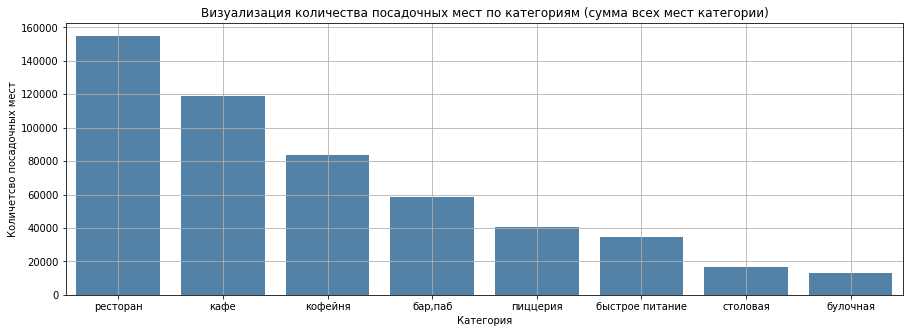

In [17]:
# Построим график barplot на сумму мест категории

plt.figure(figsize=(15, 5))
sns.barplot(x='category', y='sum', data=seats_pivot, color='#4682B4', order=seats_pivot.sort_values('sum', ascending=False).category) 
plt.title('Визуализация количества посадочных мест по категориям (сумма всех мест категории)')
plt.xlabel('Категория')
plt.ylabel('Количетсво посадочных мест')
plt.grid();

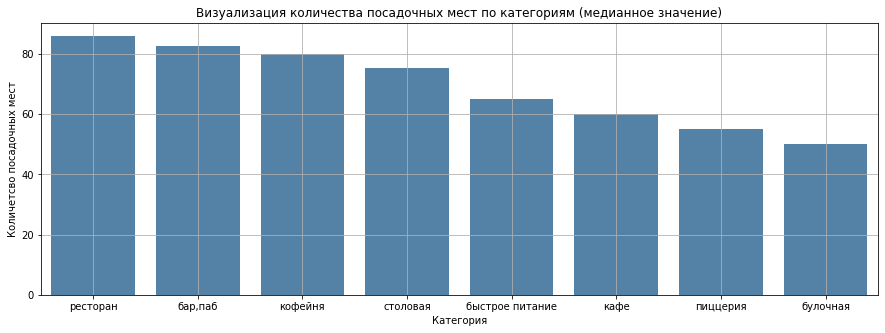

In [18]:
# Построим график barplot на медианное значение мест категории

plt.figure(figsize=(15, 5))
sns.barplot(x='category', y='median', data=seats_pivot, color='#4682B4', order=seats_pivot.sort_values('median', ascending=False).category) 
plt.title('Визуализация количества посадочных мест по категориям (медианное значение)')
plt.xlabel('Категория')
plt.ylabel('Количетсво посадочных мест')
plt.grid();

In [19]:
# Построим график Pie для визуализации доли посадочных мест

fig = go.Figure(data=[go.Pie(
    labels=seats_pivot['category'], values=seats_pivot['sum'], title='Визуализация количества посадочных мест по категориям')])
fig.show();

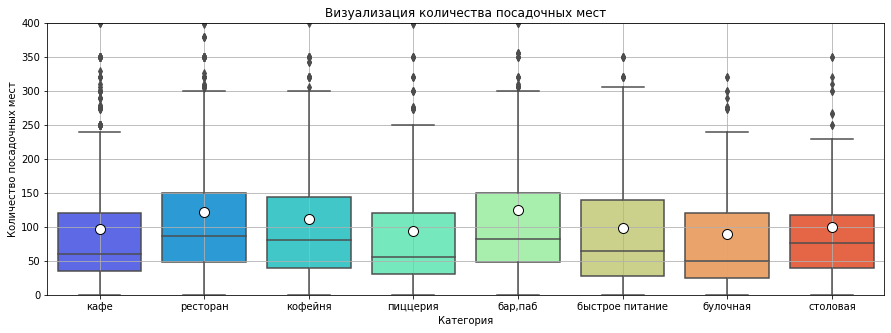

In [20]:
# Используем boxplot из seaborn, дополнительно укажем точкой среднее значение

plt.figure(figsize=(15, 5))
sns.boxplot(x='category', y='seats', data=data, palette='rainbow', showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"}) 
plt.ylim(0, 400)
plt.title('Визуализация количества посадочных мест')
plt.xlabel('Категория')
plt.ylabel('Количество посадочных мест')
plt.grid();

<b>Вывод:</b>
- Исходя из суммарных значений по категориям, больше всего посадочных мест приходится на категорию "Ресторан", 29.8% всех мест приходится на эту категорию. Второе место заняла категория "Кафе", третье "Кофейня". Меньше всего посадочных мест в категории "Булочная".


- Если оценивать ситуацию с перспективы медианного значения, и оценивать не общую картину, а усредненное место, то, на первом месте все так же будет "Ресторан" с 86 местами, однако второе место пренадлежит категории "Бар" с 82 местами.


- На графике boxplot видно очень много выбросов. В среднем у разных категорий около 100 посадочных мест.

<b>Задача 3:</b> Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [21]:
# Создаем сводную таблицу 

chain_pivot = data.groupby(['category', 'chain']).agg({'category':'count'}).rename(
    columns={'category':'count'}).sort_values(by='count', ascending=False).reset_index()
chain_pivot['share'] = (chain_pivot['count'] / chain_pivot['count'].sum()).apply(lambda x: f"{x:1.2%}")

# Переименуем сетевые/несетевые заведения для наглядности и удобства

chain_pivot.loc[chain_pivot['chain'] == 0, 'chain'] = 'несетевое заведение'
chain_pivot.loc[chain_pivot['chain'] == 1, 'chain'] = 'сетевое заведение'
chain_pivot

,category,chain,count,share
0,кафе,несетевое заведение,1599,19.02%
1,ресторан,несетевое заведение,1313,15.62%
2,кафе,сетевое заведение,779,9.27%
3,ресторан,сетевое заведение,730,8.68%
4,кофейня,сетевое заведение,720,8.57%
5,кофейня,несетевое заведение,693,8.24%
6,"бар,паб",несетевое заведение,596,7.09%
7,быстрое питание,несетевое заведение,371,4.41%
8,пиццерия,сетевое заведение,330,3.93%
9,пиццерия,несетевое заведение,303,3.60%


In [22]:
# Создаем график Pie отображающий доли

fig = go.Figure(data=[go.Pie(
    labels=chain_pivot['chain'], values=chain_pivot['count'], title='Визуализация соотношения сетевых и несетевых заведений')])
fig.show();

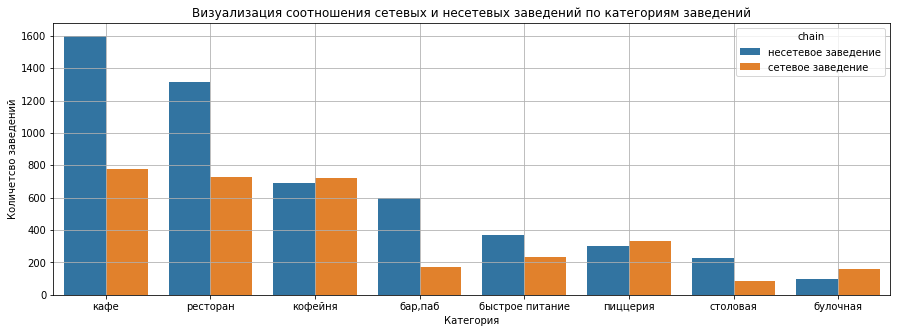

In [23]:
# Создаем график отображающий доли по категориям

plt.figure(figsize=(15, 5))
sns.barplot(x='category', y='count', data=chain_pivot, hue='chain') 
plt.title('Визуализация соотношения сетевых и несетевых заведений по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Количетсво заведений')
plt.grid();

<b>Вывод:</b>
Сетевых заведений на 23.8% меньше, чем несетевых. Если смотреть на разбивку по категориям заведений, то больше всего несетевых заведений попадают под категории "Кафе" и "Ресторан", разница у них с сетевыми почти в два раза. "Кофейни" и "Пиццерии" имеют примерно одинаковое соотношение, однако сетевых заведений чуть больше. Самый большой разрыв в соотношении, где преобладают сетевые заведения - у булочных.

<b>Задача 4:</b> Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

<b>Вывод:</b> Чаще всего сетевыми являются заведения категории:
- Булочная
- Пиццерия
- Кофейня

<b>Задача 5:</b> Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.

In [24]:
# Создаем сводную таблицу и уберем подозрительные названия заведений, прости "Яндекс Лавка", но ты, вроде, не заведение.

top_data = data[~data['name'].isin(['Кафе', 'Хинкальная', 'Шаурма', 'Ресторан', 'Столовая', 'Чайхана', 'Яндекс Лавка'])]
top_data = top_data.groupby(['name', 'category', 'chain']).agg({'name':'count'}).rename(
    columns={'name':'count'}).sort_values(by='count', ascending=False).reset_index()
total_rest = top_data['count'].sum()
top_data = top_data.iloc[:15]
top_data

,name,category,chain,count
0,Шоколадница,кофейня,1,119
1,Домино'с Пицца,пиццерия,1,76
2,Додо Пицца,пиццерия,1,74
3,One Price Coffee,кофейня,1,71
4,Cofix,кофейня,1,65
5,Prime,ресторан,1,49
6,КОФЕПОРТ,кофейня,1,42
7,Кулинарная лавка братьев Караваевых,кафе,1,39
8,Теремок,ресторан,1,36
9,CofeFest,кофейня,1,31


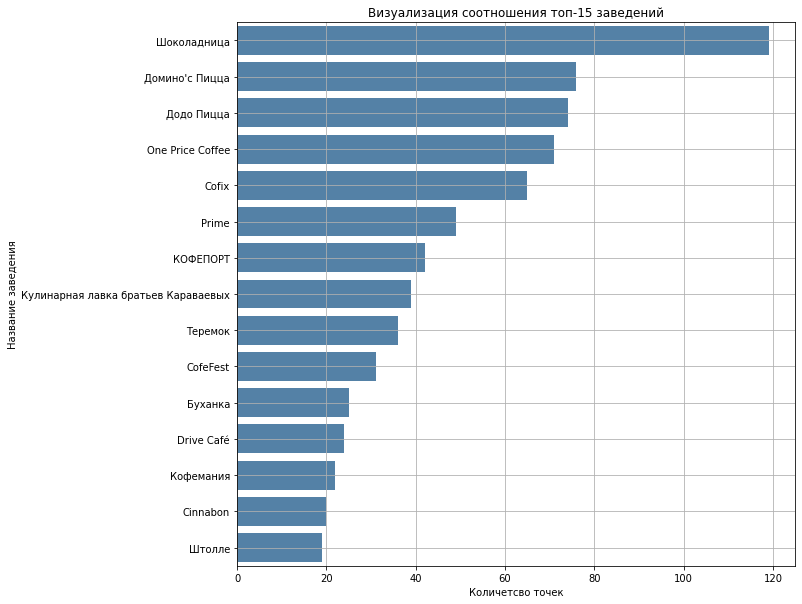

In [25]:
# Построим barplot

plt.figure(figsize=(10, 10))
sns.barplot(y='name', x='count', data=top_data, color='#4682B4') 
plt.title('Визуализация соотношения топ-15 заведений')
plt.xlabel('Количетсво точек')
plt.ylabel('Название заведения')
plt.grid();

In [26]:
# Pie

fig = go.Figure(data=[go.Pie(
    labels=top_data['name'], values=top_data['count'], title='Визуализация соотношения заведений в ТОП-15')])
fig.show();

In [27]:
# Pie

fig = go.Figure(data=[go.Pie(
    labels=top_data['category'], values=top_data['count'], title='Визуализация соотношения категории заведений по количеству открытых точек в ТОП-15')])
fig.show();

In [28]:
# Пивот на округ и категорию, посчитаем заведения

district_data = data.groupby(['district', 'category']).agg({'name':'count'}).rename(
    columns={'name':'count'}).sort_values(by='count', ascending=False).reset_index()
district_data

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


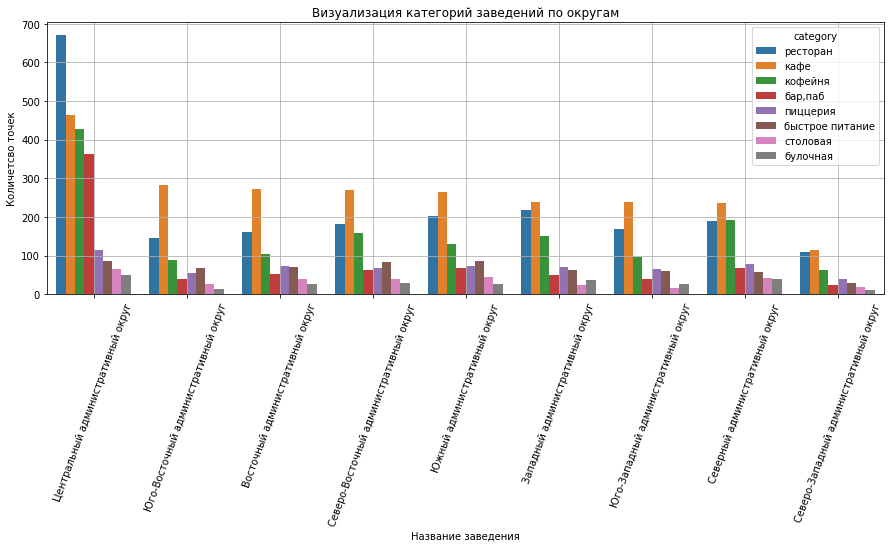

In [29]:
# Построим barplot

plt.figure(figsize=(15, 5))
sns.barplot(x='district', y='count', hue='category', data=district_data) 
plt.title('Визуализация категорий заведений по округам')
plt.xlabel('Название заведения')
plt.ylabel('Количетсво точек')
plt.xticks(rotation=70)
plt.grid();

In [30]:
# Пивот на округ и заведения

district_total_data = district_data.groupby('district').agg({'count':'sum'}).rename(
    columns={'count':'sum'}).sort_values(by='sum', ascending=False).reset_index()
district_total_data

,district,sum
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Южный административный округ,892
3,Северо-Восточный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


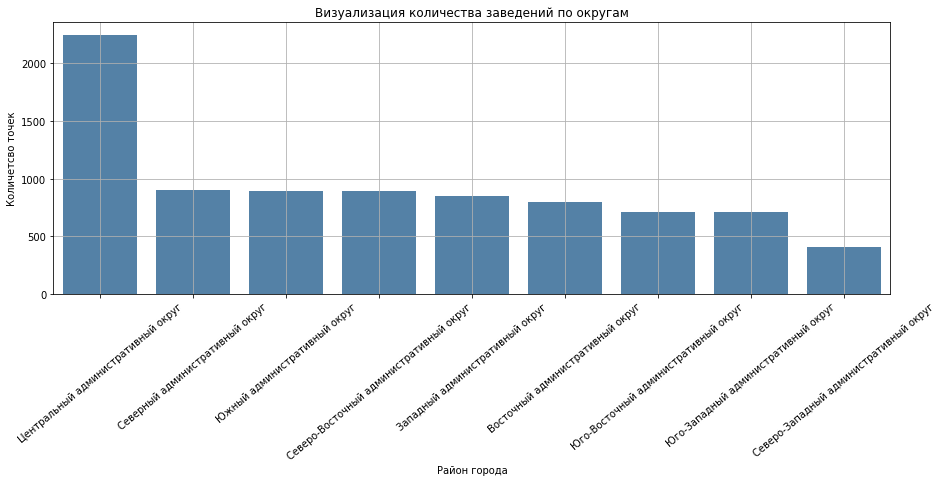

In [31]:
# Построим barplot

plt.figure(figsize=(15, 5))
sns.barplot(x='district', y='sum', data=district_total_data, color='#4682B4') 
plt.title('Визуализация количества заведений по округам')
plt.xlabel('Район города')
plt.ylabel('Количетсво точек')
plt.xticks(rotation=40)
plt.grid();

In [32]:
# Pie

fig = go.Figure(data=[go.Pie(
    labels=district_total_data['district'], values=district_total_data['sum'], title='Визуализация соотношения количества заведений по округам')])
fig.show();

<b>Вывод:</b>
В ТОП-15 преобладающе по количеству входят кофейни. Первое место по распрастраненности заняла "Шоколадница". Все заведения являются сетевыми.

Лирическое отступление - последующий вопрос полностью дублирует вопрос поставленный в этой задаче, поэтому вывод по нему буду писать в дальнейшем. Пока что попрошу зафиксировать факт дубля.

<b>Задача 6:</b> Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

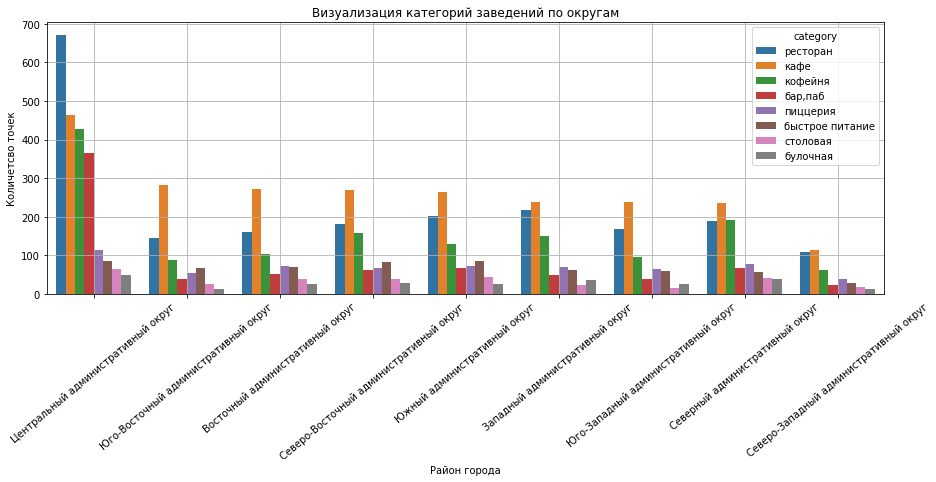

In [33]:
# Построим barplot по условию одним графиком без пивота, округ/категории

plt.figure(figsize=(15, 5))
sns.barplot(x='district', y='count', data=district_data, hue='category') 
plt.title('Визуализация категорий заведений по округам')
plt.xlabel('Район города')
plt.ylabel('Количетсво точек')
plt.xticks(rotation=40)
plt.grid();

<b>Вывод:</b>
- В топ-15 попали исключительно сетевые заведения. 
- 52% заведений топ-15 составили кофейни, на втором месте пиццерии 21.1%.
- Первое место в топ-15 заняла кофейня "Шоколадница" с большим отрывом в 1.5 раза от следующего далее "Domino's pizza".
- Всего представлено 9 административных округов.
- Больше всего заведений находится в Центральном административном округе, 2242 заведений, или 26.7% от общего числа.
- Меньше всего заведений находится в Северо-Западном административном округе, 409 заведений, или 4.87% от общего числа.
- В Центральном административном округе преобладают рестораны с существенным отрывом, далее идут кафе и кофейни. В остальных округах самая распрастраненная категория является "Кафе", далее идут рестораны и на третьем месте по популярности кофейни.

<b>Задача 7:</b> Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

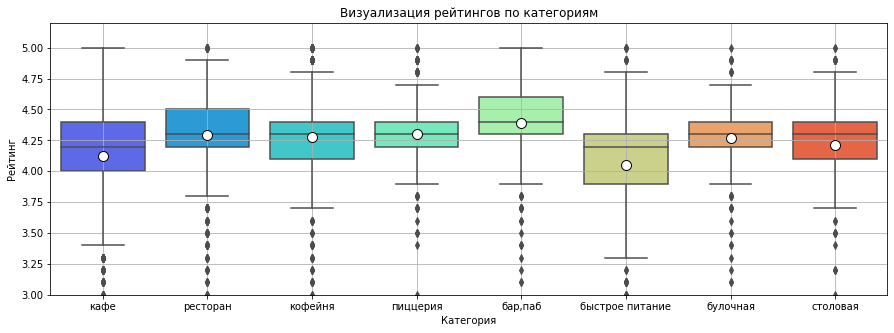

In [34]:
# Для этого задания подойдет boxplot из seaborn, дополнительно укажем точкой среднее значение

plt.figure(figsize=(15, 5))
sns.boxplot(x='category', y='rating', data=data, palette='rainbow', showmeans=True, meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"}) 
plt.ylim(3)
plt.title('Визуализация рейтингов по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.grid();

<b>Вывод:</b>
Средний рейтинг в разных категориях плавает от ~4.1 до ~4.4
Самые высокие рейтинги получает категория "Бар, паб", самые низкие рейтинги у категории "Быстрое питание".

<b>Задача 8:</b> Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [35]:
# Для каждого округа посчитаем средний рейтинг заведений, которые находятся на его территории

rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_data

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [36]:
# загружаем JSON-файл с границами округов Москвы

state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту

m

<b>Вывод:</b>
Благодаря визуализации можем сделать вывод что в центре Москвы рейтинги в заведениях выше всего, юго-восток имеет самый низкий усредненный рейтиг, северо-запад хуже центра, однако лучше всех остальных районов, остальные +/- одинаково. 

<b>Задача 9:</b> Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [37]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<b>Задача 10:</b> Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

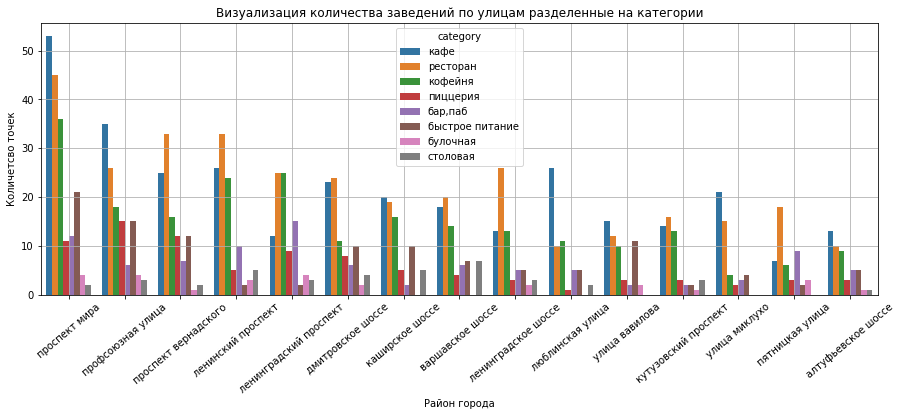

In [38]:
# Можно было сделать вариант через y='street' и видоизменить график для красоты, но мне глазу удобнее видеть так

plt.figure(figsize=(15, 5))
sns.countplot(x='street', hue='category', data=data, order=data.street.value_counts().iloc[:15].index)
plt.title('Визуализация количества заведений по улицам разделенные на категории')
plt.xlabel('Район города')
plt.ylabel('Количетсво точек')
plt.xticks(rotation=40)
plt.grid();

<b>Вывод:</b>
Самая популярная улица - Проспект мира с преобладающим количеством кафе и ресторанов. Последнее место в ТОП-15 - Алтуфьевское шоссе.

<b>Задача 11:</b> Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [39]:
# Отфильтруем и найдем эти улицы

street_data = data.groupby('street').agg({'name':'count'}).rename(
    columns={'name':'count'}).sort_values(by='count', ascending=True).reset_index()
street_data = street_data.loc[street_data['count'] == 1]
street_data = data.loc[data['street'].isin(street_data['street'])]

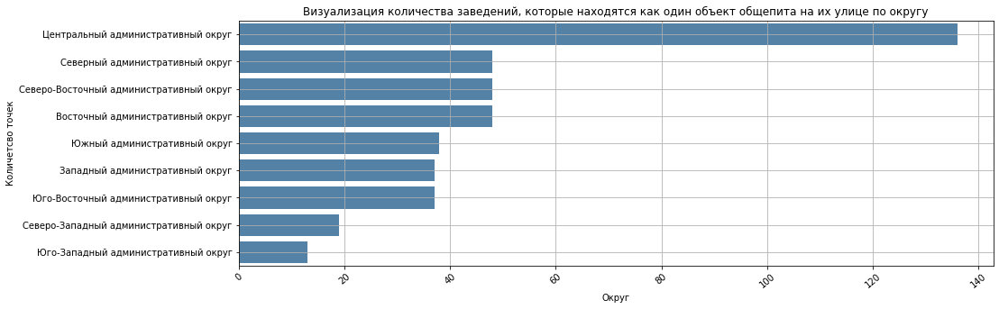

In [40]:
# Построим график по количеству этих заведений по округам

plt.figure(figsize=(15, 5))
sns.countplot(y='district', data=street_data, color='#4682B4', order=street_data['district'].value_counts().index)
plt.title('Визуализация количества заведений, которые находятся как один объект общепита на их улице по округу')
plt.xlabel('Округ')
plt.ylabel('Количетсво точек')
plt.xticks(rotation=40)
plt.grid();

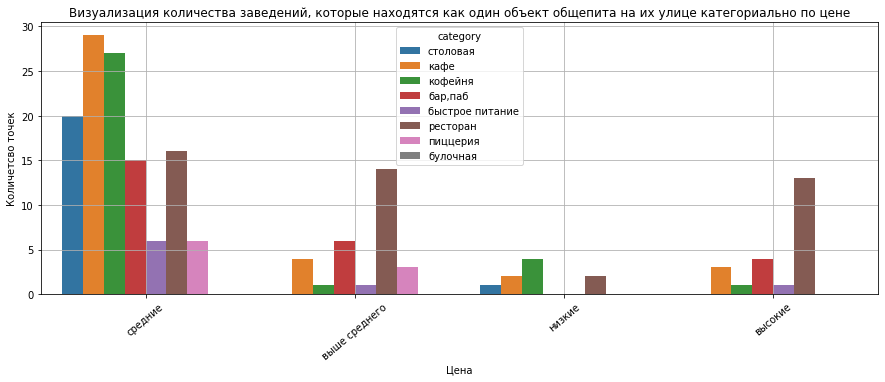

In [41]:
# Посмотрим как обстоят дела с ценами в этих заведениях

plt.figure(figsize=(15, 5))
sns.countplot(x='price', hue='category', data=street_data)
plt.title('Визуализация количества заведений, которые находятся как один объект общепита на их улице категориально по цене')
plt.xlabel('Цена')
plt.ylabel('Количетсво точек')
plt.xticks(rotation=40)
plt.grid();

In [42]:
# Посмотрим более нагладно на доли категорий этих заведений

fig = go.Figure(data=[go.Pie(
    labels=street_data['category'], values=street_data['category'].value_counts(), title='Визуализация отношения категорий заведений, которые находятся как один объект общепита на их улице')])
fig.show();

<b>Вывод:</b>
Объекты общепита, которые находятся одни на своей улице находятся в основном в Центральном административном округе. В основном это кафе, кофейни и столовые. Чек в этих заведения в основном подходит под категорию "Средние". 

<b>Задача 12:</b> Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [43]:
# Посчитаем медиану по округам

bill_data = data.groupby('district').agg({'middle_avg_bill':'median'}).rename(
    columns={'middle_avg_bill':'median'}).sort_values(by='median', ascending=False).reset_index()
bill_data

,district,median
0,Западный административный округ,1000.00
1,Центральный административный округ,1000.00
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


In [44]:
# загружаем JSON-файл с границами округов Москвы

state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы

moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=bill_data,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Значения медианных чеков заведений по районам',
).add_to(m)

# выводим карту

m

<b>Вывод:</b> 
Центральный административный округ и Западный административный округ имеют одинаковые медианные значения чеков, т.е. центр и запад Москвы можно охарактеризовать как дорогими, на юго-западе и северо-западе чек становится ниже. На юге, севере и юго-востоке медианное значение чека самые низкие.

<b>Задача 13:</b> Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

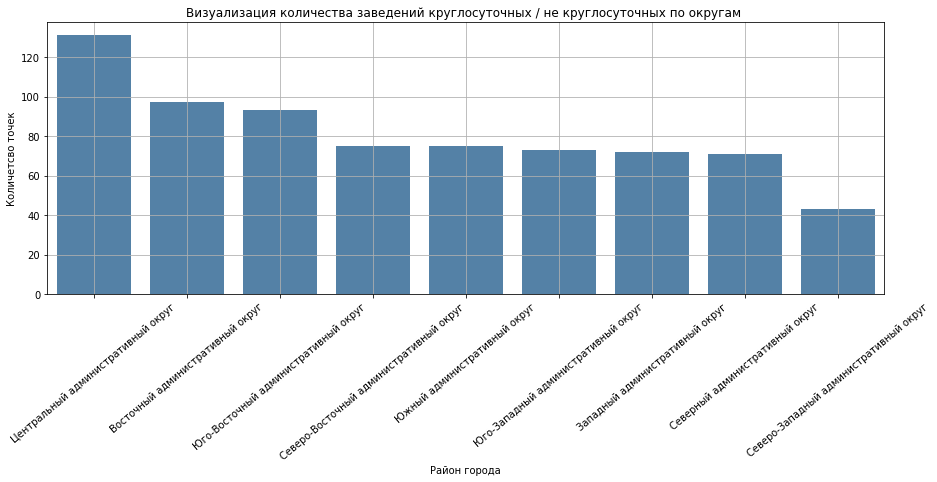

In [45]:
# Построим barplot, посмотрим соотношение круглосуточных и не круглосуточных заведений по округам

plt.figure(figsize=(15, 5))
sns.countplot(x='district', data=data.loc[data['is_24/7'] == True], color='#4682B4', order=data.loc[data['is_24/7'] == True, 'district'].value_counts().index)
plt.title('Визуализация количества заведений круглосуточных / не круглосуточных по округам ')
plt.xlabel('Район города')
plt.ylabel('Количетсво точек')
plt.xticks(rotation=40)
plt.grid();

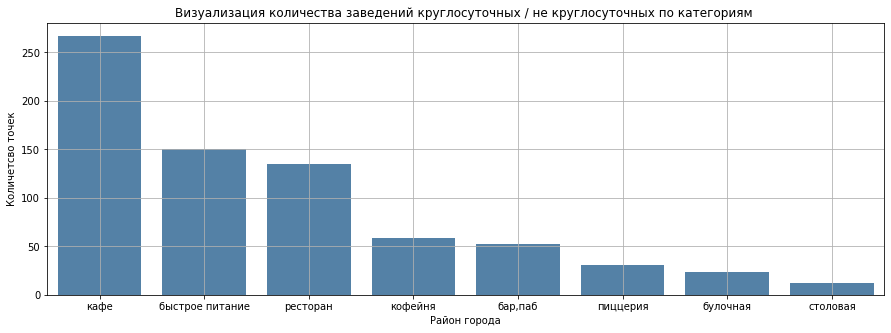

In [46]:
# Построим barplot, посмотрим соотношение круглосуточных и не круглосуточных заведений по категориям

plt.figure(figsize=(15, 5))
sns.countplot(x='category', data=data.loc[data['is_24/7'] == True], color='#4682B4', order=data.loc[data['is_24/7'] == True, 'category'].value_counts().index)
plt.title('Визуализация количества заведений круглосуточных / не круглосуточных по категориям ')
plt.xlabel('Район города')
plt.ylabel('Количетсво точек')
plt.grid();

In [47]:
# Определим плохой рейтинг как все, что равно или ниже 3.5 балла

bad_rating = data.loc[data['rating'] <= 3.5]
bad_rating = bad_rating.groupby('category').agg({'middle_avg_bill':'mean'}).rename(
    columns={'middle_avg_bill':'mean'}).sort_values(by='mean', ascending=False).reset_index()

In [48]:
# Pie

fig = go.Figure(data=[go.Pie(
    labels=bad_rating['category'], values=data.loc[data['rating'] <= 3.5, 'category'].value_counts(), title='Визуализация соотношения количества заведений по районам')])
fig.show();

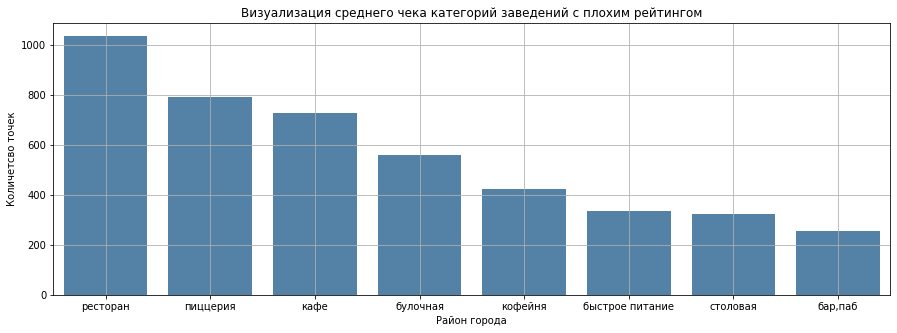

In [49]:
# Построим boxplot с чеком заведений с плохим рейтингом

plt.figure(figsize=(15, 5))
sns.barplot(x='category', y='mean', data=bad_rating, color='#4682B4') 
plt.title('Визуализация среднего чека категорий заведений с плохим рейтингом')
plt.xlabel('Район города')
plt.ylabel('Количетсво точек')
plt.grid();

<b>Вывод:</b> 
Если рейтинг оставляют ниже 3.5, то почти 50% это будет ресторан. В ресторанах с плохим рейтингом средний чек выше всех остальных категорий.

<b>Задача 14.</b> Соберите наблюдения по вопросам выше в один общий вывод.

<b>Общий вывод:</b>

1. Получив данные мы сделали первичный общий анализ полученного файла, раскомментировали и обозначили значения в столбцах, посчитали пропуски и заменили типы данных.

2. В ходе анализа данных определили категории объектов общественного питания, а так же визуализировали их доли в датафрейме. Определили самые популярные и самые не популярные категории общественного питания. Самой популярной является категория "Кафе", её доля составила 28.3% от всех заведений в датафрейме. Самые непопулярные категории стали "Столовые" и "Булочные"

3. Исследовали и определили посадочные места заведений. Больше всего суммарно мест для посадки гостей у категории "Ресторан", однако медианные значения очень близки у ресторанов, кофеин и баров. 

4. Сетевых заведений оказалось 38.1% от общего количества, несетевых заведений 61.9. Разница составила 23.8% в пользу несетевых. Больше всего несетевых заведений у категорий "Кафе" и "Ресторан". Соотношение "сетевой" и "несетевой" у двух этих категорий примерно составляет 1 к 2. Больше всего внутри категории сетевые заведения преобладают в "Булочных", "Пиццериях" и "Кофейнях"

5. Сгруппировали и определили самые распрастраненные заведения в Москве. Определили ТОП-15 заведений по распрастраненности в Москве. Самая распрастраненная сеть стала "Шоколадница". Среди ТОП-15 самых распрастраненных заведений Москвы внушительно преобладает категория "Кофейня".  

6. Зафиксировали и проанализировали 9 административных Московских округов. Самая большая аггрегация заведений приходится на центральный округ. Меньше всего заведений на северо-западе. В центре Москвы преобладают рестораны.

7. Проанализировали среднюю оценку заведениям. Оценка "плавает" от 4.1 до 4.4 балла в зависимости от категории. Самая высокооцененная категория оказалась "Бары, пабы", самая низкая оценка у "Быстрого питания"

8. Построили фоновую картограмму и определили что в центре Москвы рейтинги заведений выше. Отобразили местонахождение заведений при помощи folium.

9. Определили ТОП-15 улиц. Больше всего заведений находится на улице проспект Мира. 

10. Определелили улицы на которых находится только один объект общепита, сделали анализ этих объектов. В основном это оказались столовые, кофейни и кафе. 

11. Определили медианные чеки по округам при помощи фоновой картограммы. Центр и запад Москвы определили как "дорогие" округи.

# Шаг 4. Детализируем исследование: открытие кофейни

<b>Ответьте на следующие вопросы:</b>


(в расчетах будет использоваться медиана для минимализации выбросов)

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [50]:
# Создадим отдельно датасет только с кофейнями

coffee_data = data.loc[data['category'] == 'кофейня']

In [51]:
# Ответ на вопрос

print('Всего в датасете', len(coffee_data), 'кофейни')

Всего в датасете 1413 кофейни


In [52]:
# Для визуализации кофеин по округам

coffee_district = coffee_data.groupby('district').agg({'name':'count'}).rename(
    columns={'name':'count'}).sort_values(by='count', ascending=False).reset_index()
display(coffee_district)

# Для визуализации кофеин по улицам

coffee_street = coffee_data.groupby('street').agg({'name':'count'}).rename(
    columns={'name':'count'}).sort_values(by='count', ascending=False).reset_index().loc[:10]
display(coffee_street)

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


,street,count
0,проспект мира,36
1,ленинградский проспект,25
2,ленинский проспект,24
3,профсоюзная улица,18
4,каширское шоссе,16
5,проспект вернадского,16
6,варшавское шоссе,14
7,ленинградское шоссе,13
8,новослободская улица,13
9,кутузовский проспект,13


In [53]:
# Построим график Pie для визуализации соотношения количества кофеин по округам

fig = go.Figure(data=[go.Pie(
    labels=coffee_district['district'], values=coffee_district['count'], title='Визуализация соотношения количества кофеин по округам')])
fig.show();

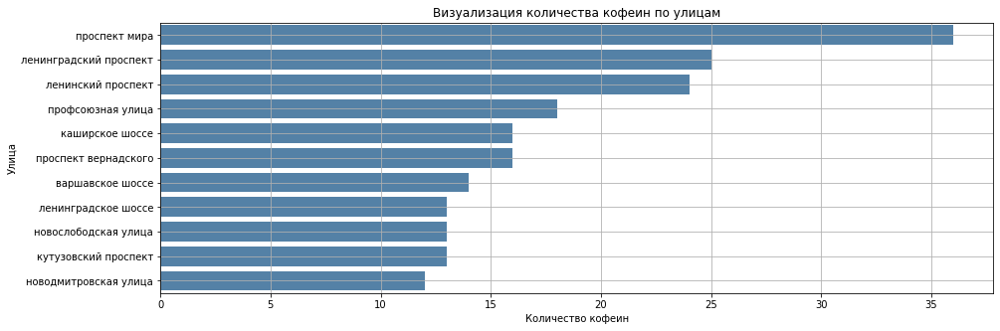

In [54]:
# Построим график для визуализации количества кофеин по улицам, сделаем ТОП-10 кофейных улиц 

plt.figure(figsize=(15, 5))
sns.barplot(y='street', x='count', data=coffee_street, color='#4682B4')
plt.title('Визуализация количества кофеин по улицам')
plt.xlabel('Количество кофеин')
plt.ylabel('Улица')
plt.grid();

<b>Вывод:</b> 
Всего в датесете удалось найти 1413 кофейни. Больше всего заведений такого типа приходится на Центральный административный округ (30.3%), так же стоит отметить что по количеству кофеин далее идут Северный и Северо-восточны административные округа. 
Что касается улиц - самая "кофейная" улица - "Проспект мира", на ней 36 кофеен. Далее "Ленинградский проспект" и "Ленинский проспект" с 25 и 24 кофейнями соответственно.

- Есть ли круглосуточные кофейни?

In [55]:
coffee_data['is_24/7'].value_counts()

False    1354
True       59
Name: is_24/7, dtype: int64

<b>Вывод:</b> 
Да, в датасете представлены 59 круглосуточных кофейни.

- Какие у кофеен рейтинги? Как они распределяются по районам?

In [56]:
print('Средний рейтинг кофеин', round(coffee_data['rating'].mean(), 2))
print('Медианный рейтинг кофеин', coffee_data['rating'].median())

Средний рейтинг кофеин 4.28
Медианный рейтинг кофеин 4.3


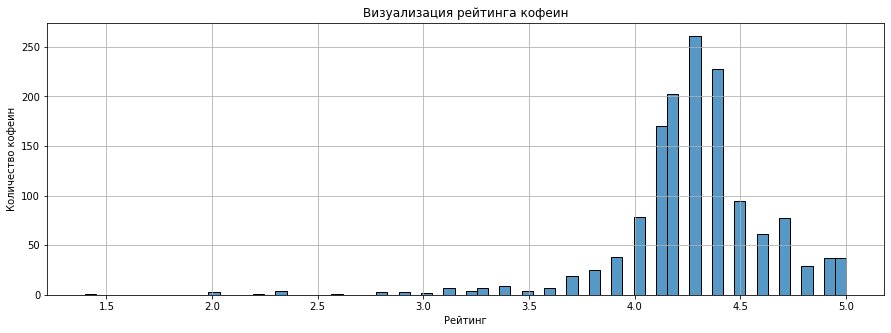

In [57]:
# Посмотрим гистограмму распределение рейтинга

plt.figure(figsize=(15, 5))
sns.histplot(coffee_data['rating'])
plt.title('Визуализация рейтинга кофеин')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеин')
plt.grid();

In [58]:
# Соберем сводную таблицу округов с их среднем рейтингом заведений

coffee_avg_district = coffee_data.groupby('district').agg({'rating':'mean'}).sort_values(
    by='rating', ascending=False).reset_index()
display(coffee_avg_district)

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


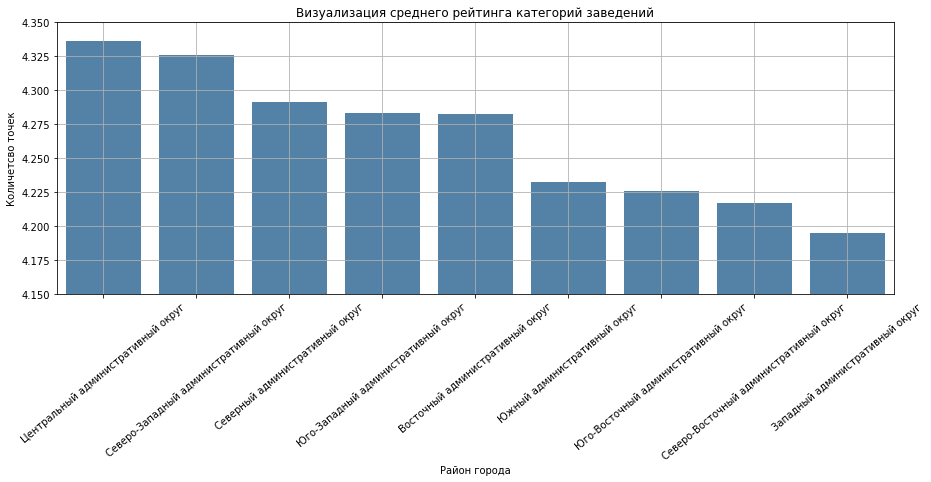

In [59]:
# Построим boxplot рейтингов заведений

plt.figure(figsize=(15, 5))
sns.barplot(x='district', y='rating', data=coffee_avg_district, color='#4682B4') 
plt.title('Визуализация среднего рейтинга категорий заведений')
plt.xlabel('Район города')
plt.ylabel('Количетсво точек')
plt.ylim(4.15, 4.35)
plt.xticks(rotation=40)
plt.grid();

<b>Вывод:</b>
Средний рейтинг кофейни по Москве составил 4.28 балла, медианный рейтинг 4.3 балла. Обычно посетители оценивают кофейни Москвы в районе 4 - 4.5 балла. Самые высокие рейтинги имеют кофейни, которые находятся в Центральном административном округе, со средним рейтингом 4.34 балла. Самые низкооцененные кофейни находятся в Западном административном округе, со средним рейтингом 4.2 балла.

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [60]:
print('Медиана цен на капучино по Москве составила', coffee_data['middle_coffee_cup'].median(), 'рублей')

Медиана цен на капучино по Москве составила 170.0 рублей


Однако давайте посмотрим распределение цен по округам Москвы.

In [61]:
# Соберем данные о цене чашки кофе по округам 

coffee_price_district = coffee_data.groupby(['district']).agg({'middle_coffee_cup':'median'}).sort_values(
    by='middle_coffee_cup', ascending=False).reset_index()
coffee_price_district

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.00
1,Центральный административный округ,190.00
2,Западный административный округ,189.00
3,Северо-Западный административный округ,165.00
4,Северо-Восточный административный округ,162.50
5,Северный административный округ,159.00
6,Южный административный округ,150.00
7,Юго-Восточный административный округ,147.50
8,Восточный административный округ,135.00


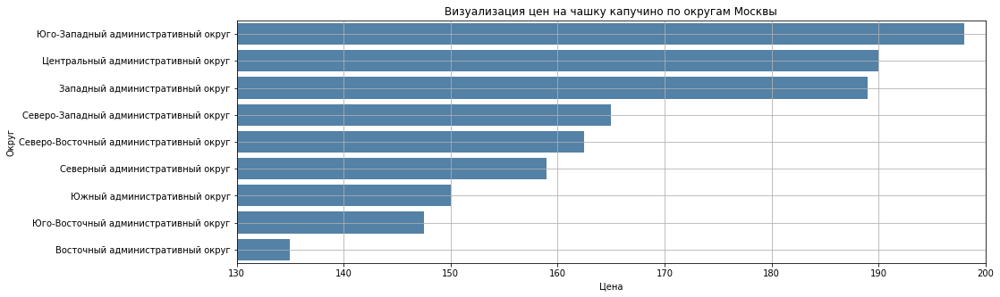

In [62]:
# Построим график цен чашки кофе по округам

plt.figure(figsize=(15, 5))
sns.barplot(x='middle_coffee_cup', y='district', data=coffee_price_district, color='#4682B4') 
plt.title('Визуализация цен на чашку капучино по округам Москвы')
plt.xlabel('Цена')
plt.ylabel('Округ')
plt.xlim(130, 200)
plt.grid();

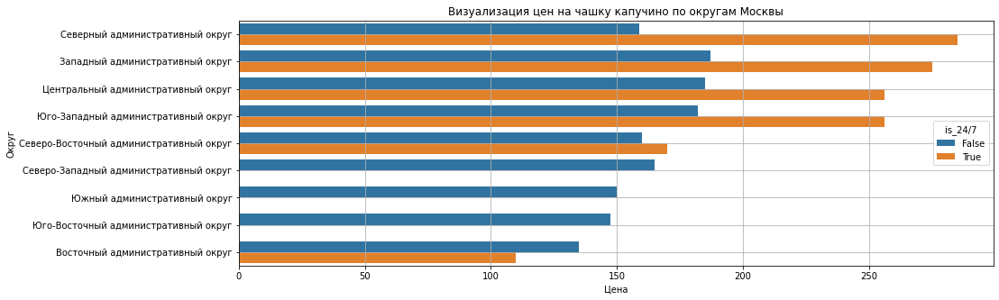

In [63]:
# Дополнительно посмотрим влияние статуса 24/7 по регионам на цену

coffee_price_district_247 = coffee_data.groupby(['district', 'is_24/7']).agg({'middle_coffee_cup':'median'}).sort_values(
    by='middle_coffee_cup', ascending=False).reset_index()


plt.figure(figsize=(15, 5))
sns.barplot(x='middle_coffee_cup', y='district', hue='is_24/7', data=coffee_price_district_247) 
plt.title('Визуализация цен на чашку капучино по округам Москвы')
plt.xlabel('Цена')
plt.ylabel('Округ')

plt.grid();

<b>Вывод:</b>
Медиана цен на чашку капучино по Москве составила 170 рублей, однако если рассматривать отдельные округи города, то можно увидеть, что самая большая цена за чашку в Юго-Западном и Центральном административных округах - 198 и 190 рублей соответственно. Самая дешевая чашка капучино в Восточном административном округе, медиана цен там составила 135 рублей.

- Влияние статуса "сетевое" или "несетевое" на цену чашки капучино.

In [64]:
# Создадим сводную таблицу с отображением медианной цены на стакан кофе в зависимости от статуса

coffee_chain = coffee_data.groupby('chain').agg({'middle_coffee_cup':'median'}).sort_values(
    by='middle_coffee_cup', ascending=False).reset_index()

coffee_chain.loc[coffee_chain['chain'] == 0, 'chain'] = 'несетевое заведение'
coffee_chain.loc[coffee_chain['chain'] == 1, 'chain'] = 'сетевое заведение'

coffee_chain

,chain,middle_coffee_cup
0,несетевое заведение,170.00
1,сетевое заведение,154.50


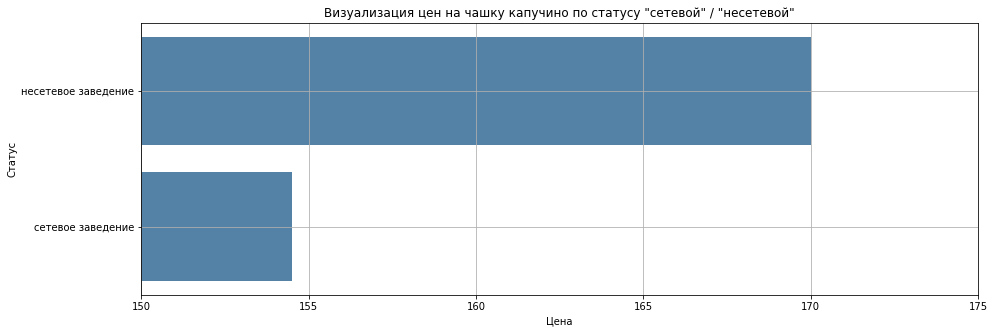

In [65]:
# Посмотрим визуально на таблицу с медианной ценой на стакан кофе в зависимости от статуса

plt.figure(figsize=(15, 5))
sns.barplot(x='middle_coffee_cup', y='chain', data=coffee_chain, color='#4682B4') 
plt.title('Визуализация цен на чашку капучино по статусу "сетевой" / "несетевой"')
plt.xlabel('Цена')
plt.ylabel('Статус')
plt.xlim(150, 175)
plt.grid();

In [66]:
print('Разница цены составила', coffee_chain['middle_coffee_cup'][0] - coffee_chain['middle_coffee_cup'][1], 'Рублей')

Разница цены составила 15.5 Рублей


<b>Вывод:</b>
В несетевых заведениях чашка капучино обойдется на 15.5 рублей дороже, чем в сетевых.

- Влияние статуса "круглосуточное" или "не круглосуточное" на цену чашки капучино.

In [67]:
# Создадим сводную таблицу с ценой на стакан кофе в зависимости от статуса работы заведения

coffee_24 = coffee_data.groupby('is_24/7').agg({'middle_coffee_cup':'median'}).sort_values(
    by='middle_coffee_cup', ascending=False).reset_index()

coffee_24.loc[coffee_24['is_24/7'] == False, 'is_24/7'] = 'Не круглосуточное'
coffee_24.loc[coffee_24['is_24/7'] == True, 'is_24/7'] = 'Круглосуточное'

coffee_24

,is_24/7,middle_coffee_cup
0,Круглосуточное,256.00
1,Не круглосуточное,165.00


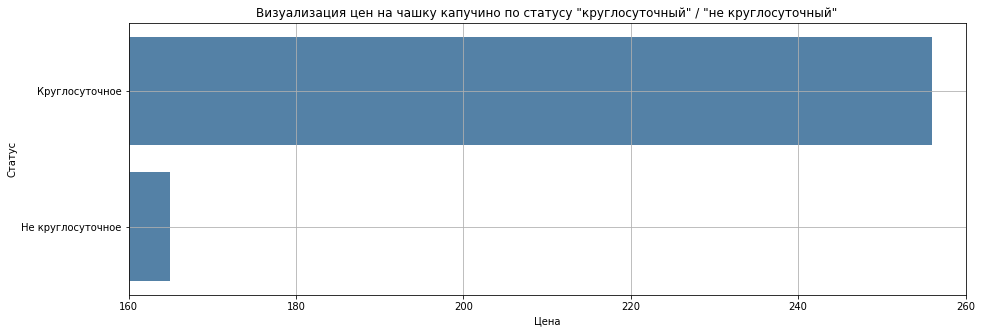

In [68]:
# Посмотрим визуально на созданую таблицу

plt.figure(figsize=(15, 5))
sns.barplot(x='middle_coffee_cup', y='is_24/7', data=coffee_24, color='#4682B4') 
plt.title('Визуализация цен на чашку капучино по статусу "круглосуточный" / "не круглосуточный"')
plt.xlabel('Цена')
plt.ylabel('Статус')
plt.xlim(160, 260)
plt.grid();

In [69]:
print('Разница цены составила', coffee_24['middle_coffee_cup'][0] - coffee_24['middle_coffee_cup'][1], 'Рублей')

Разница цены составила 91.0 Рублей


<b>Вывод:</b>
В круглосуточных кофейнях чашка капучино будет дороже примерно на 91 рубль.

# Рекомендации

Легенда:

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. 

Рекомендации:

Изучив данные из открытых источников, удалось узнать примерное местоположение, на которое ориентировались создатели сериала. Улица 130 E 23rd St, New York, NY 10016, США - находится в Манхэттене, южной части. Манхэттен можно считать центральной частью города. Если учитывать территориальное месторасположение оригинальной кофейни, то в Москве можно смотреть в сторону Центрального административного округа. Если планируется открывать круглосуточное кафе, то цену на чашку капучино можно определить в 250-280 рублей, если планируется не круглосуточное, то цену можно определить в 150-180 рублей за чашку кофе. В Центральном административном округе сосредоточено наибольшее количество кофеин в городе. Более точно определить цену за чашку можно расчитав и определив траты на аренду и другие расходы и конкурентов поблизости. Так же следует учесть что в Центральном административном округе рейтинги конкурентов довольно высокие, следовательно нужно более плотно заняться удовлетворением потребностей клиентов. 

Презентация: https://disk.yandex.ru/i/_FGfCkHlyRKkYw 

Обновленная презентация: https://disk.yandex.ru/i/xHIkjnPZ0YNCmg